# <font color=blue> __SCODA explorer__  </font>

- This Jupyter notebook presents a case study of autoimmune disease research using SCODA.
- Reference paper: [Integrative analysis of single-cell RNA-seq and gut microbiome metabarcoding data elucidates macrophage dysfunction in mice with DSS-induced ulcerative colitis](https://www.nature.com/articles/s42003-024-06409-w).
- Key summary of the paper:

<div>
  <img src="https://raw.githubusercontent.com/combio-dku/KEGGPathviewGen4SCODA/main/images/KEGG_pathview_UC_mac.png" align="center"/>
</div>

MLBI-lab, July 21, 2025


## __3. Install required packages and import them__
이제 파일이 준비되었으니 필요한 패키지를 설치하고 이를 불러와서(import해서) 데이터를 들여다 볼 수 있습니다.

In [ ]:
## 필요한 패키지 설치 (이미 설치되었다면 skip 해도 됩니다.)
'''
!pip install gdown
!pip install numpy
!pip install pandas
!pip install scipy
!pip install matplotlib
!pip install scikit-learn
!pip install seaborn
!pip install scikit-network
!pip install statannot
!pip install statannotations
!pip install lifelines
!pip install plotly
'''
!pip install scanpy
!pip install scoda-viz

In [2]:
## 필요한 패키지 불러오기
import copy, warnings, os
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz import plot_population, plot_population_grouped
from scodaviz import plot_cci_dot, plot_cci_circ_group
from scodaviz import plot_gsa_bar, plot_gsa_dot
from scodaviz import plot_deg, plot_marker_exp
from scodaviz import plot_cnv, plot_violin, plot_pct_box
from scodaviz import get_sample_to_group_map, plot_sankey

from scodaviz import get_population, get_cci_means, get_gene_expression_mean
from scodaviz import get_markers_from_deg, test_group_diff, filter_gsa_result
from scodaviz import find_condition_specific_markers, find_genomic_spots_of_cnv_peaks
from scodaviz import load_scoda_processed_sample_data, get_abbreviations

warnings.filterwarnings('ignore')

https://github.com/combio-dku
INFO: statannotations was sucessfully installed.


## __4A. Download a preprocessed data__

In [3]:
adata_t = load_scoda_processed_sample_data( 'Colitis-mm' )
adata_t

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1QgdmySeTYQjW0NfNxbpaokU22VpEpcHA
From (redirected): https://drive.google.com/uc?export=download&id=1QgdmySeTYQjW0NfNxbpaokU22VpEpcHA&confirm=t&uuid=b8c53dd8-7751-4b40-a5d1-f89724392c7e
To: /content/downloaded
100%|██████████| 207M/207M [00:01<00:00, 119MB/s]


File saved to: colon_mm_GSE264408_39K.h5ad


AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

## __4B. Or, load your h5ad file__

In [ ]:
file_h5ad = 'colon_mm_GSE264408_39K.h5ad'

In [ ]:
adata_t = sc.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

## __5. Check your data__

#### __AnnData Format__
  
<div>
<img src="https://drive.google.com/uc?export=view&id=1IGjZpO_DeaNFiX3u_fy_rnPC1oKwVsqU" align="center" width="500"/>
</div>
<div>
<img src="attachment:fefeae20-ad05-4cea-8327-72f3dd19903f.png" width="500"/>
</div>

https://anndata.readthedocs.io/en/stable/

#### __Basic operations__
1. cell selection, gene selection (supports boolean indexing as for DataFrame)
3. writing to a file
4. getting cell-by-gene count matrix as a data frame
5. adding an annotation

In [4]:
adata_t

AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

In [ ]:
adata_t.obs.head()

In [ ]:
b = adata_t.obs['celltype_major'] == 'Epithelial cell'
adata = adata_t[b,:]
adata

In [ ]:
adata.write('Epi_only.h5ad')

-  #### SCODA를 이용하여 생성된 결과는 다음과 같다.
    - __적용된 분석 파라미터__: adata_t.uns['analysis_parameters']
    - __celltype annotation 결과__: adata_t.obs[['celltype_major', 'celltype_minor', 'celltype_subset']]
    - __celltype annotation 결과의 상세내용__: adata_t.obsm['HiCAT_result']
    - __celltype annotation에 사용된 celltype marker 정보__: adata_t.uns['Celltype_marker_DB']
    - __InferCNV 결과__: adata_t.obsm['X_cnv'], adata_t.obsm['X_cnv_pca'], adata_t.obs[['cnv_score', 'cnv_cluster']]
    - __InferCNV 분석 파라미터 및 관련 정보__: adata_t.uns['cnv'], adata_t.uns['cnv_neighbors_info'], adata_t.uns['cnv_ref_celltypes']
    - __InferPloidy 결과__: adata_t.obs[['ploidy_dec', 'ploidy_score']
    - __Cell간 상호작용 추론 결과__: adata_t.uns['CCI_sample'] (샘플별), adata_t.uns['CCI'] (조건별)
    - __DEG 결과__: adata_t.uns['DEG'], adata_t.uns['DEG_stat']
    - __GSA/GSEA 결과__: adata_t.uns['GSA_down'], adata_t.uns['GSA_up'], adata_t.uns['GSEA']

In [ ]:
adata_t.obs[['sample', 'condition']].value_counts()

In [7]:
lst = [adata_t.obs['condition'], adata_t.obs['sample']]
plot_sankey(lst, title=None, fs=12, WH=(400, 600), th=30, title_y=0.85 )

In [8]:
lst = [adata_t.obs['celltype_subset'], adata_t.obs['celltype_minor'], adata_t.obs['celltype_major']]
plot_sankey(lst, title=None, fs=12, WH=(700, 800), th=30, title_y=0.85 )

In [ ]:
adata_t.obs['celltype_major'].value_counts()

In [ ]:
adata_t.obs['celltype_minor'].value_counts()

## __6. Explore your data__
### __UMAP 및 celltype annotation 결과__

In [9]:
rename_dict = get_abbreviations()
sample_group_map = adata_t.uns['lut_sample_to_cond']

In [10]:
## adata_t의 사본을 만들어서 adata에 저장
adata = adata_t[:,:]
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

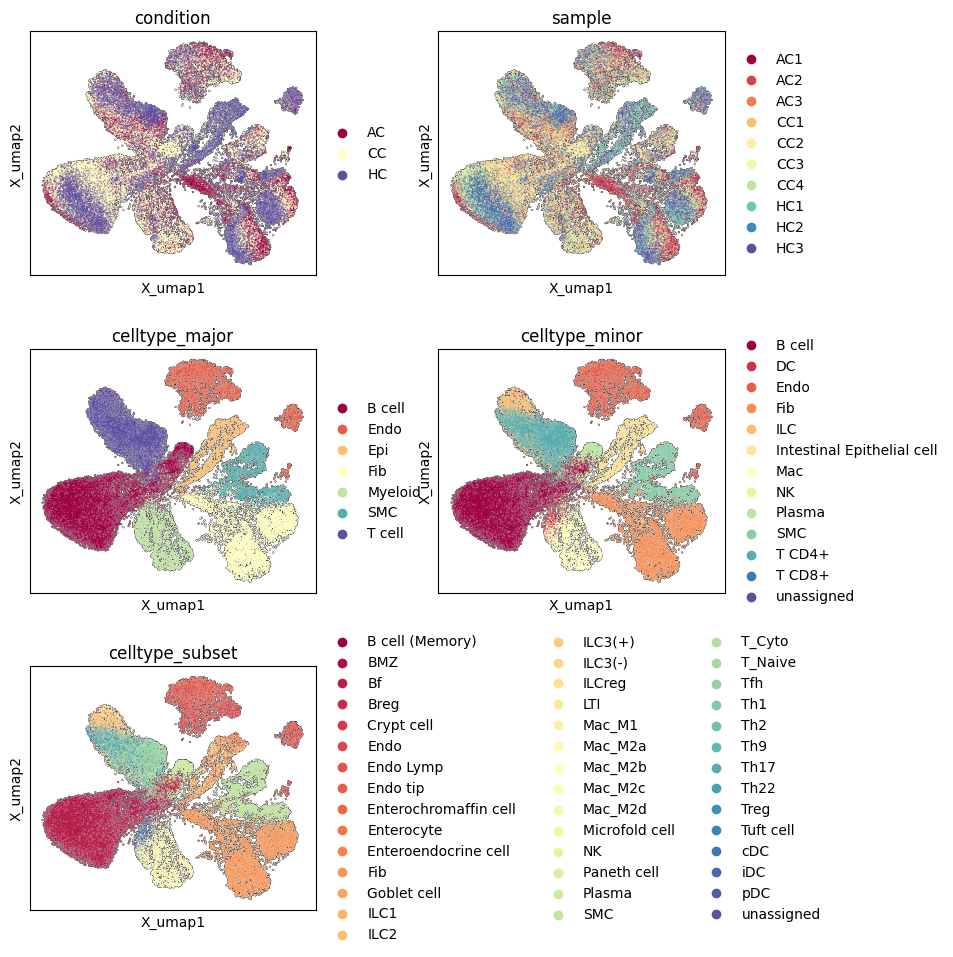

In [11]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

ws_hs = (0.3, 0.3)
plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

- __HiCAT:__ https://github.com/combio-dku/HiCAT

Major type/minor type annotation이 잘 되었는지 확인하기 위해 잘 알려진 마커들의 발현 패턴을 확인함

In [ ]:
adata.obs['celltype_minor'].value_counts()

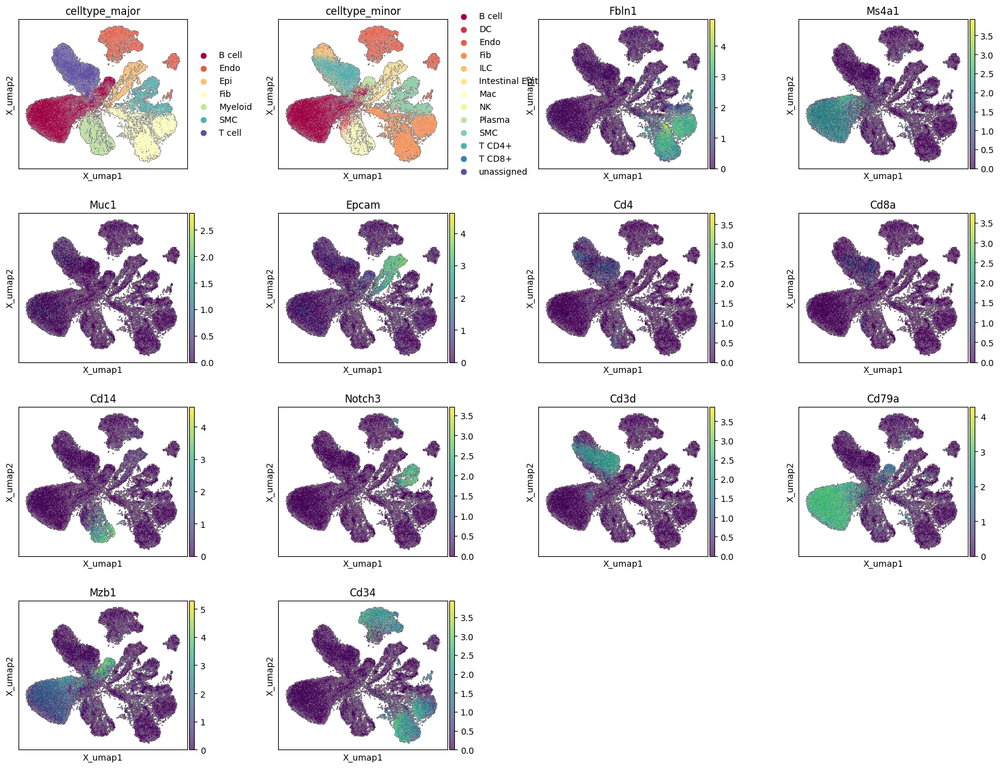

In [13]:
items_to_plot = ['celltype_major', 'celltype_minor']

if adata_t.uns['usr_param']['species'] == 'human':
    genes = ['CD3D', 'CD4', 'CD8A', 'CD79A', 'MS4A1', 'MZB1',
             'CD14', 'LYZ', 'FBLN1', 'NOTCH3', 'EPCAM', 'MUC1',  'CD34']
else:
    genes = ['Cd3d', 'Cd4', 'Cd8a', 'Cd79a', 'Ms4a1', 'Mzb1',
             'Cd14', 'Lyz', 'Fbln1', 'Notch3', 'Epcam', 'Muc1',  'Cd34']

## 위 목록의 마커 유전자들 중 현재의 데이터에 있는 유전자들만 순서대로 선택
genes_all = list(adata.var.index.values)
items_to_plot = items_to_plot + list(set(genes).intersection(genes_all))

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3, legend_fontsize = 10,
                 ncols = 4, palette = 'Spectral', add_outline = True)

#### __Subset marker expression pattern 확인__
- Subset annotation은 UMAP으로 확인하기 어려우므로 dot plot을 사용하여 확인
- dot의 크기는 annotation 결과 기준으로 해당 유형의 세포 중 얼마나 많은 비율이 해당 유정의 마커 유전자를 발현하고 있는지 보여줌


Num markers selected: 187 -> 120


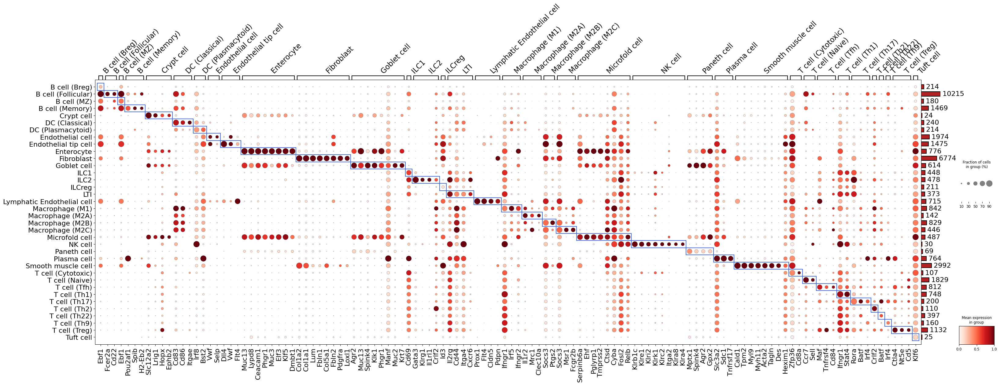

In [14]:
plot_marker_exp(  adata_t, markers = None,
                  N_cells_per_group_min = 10, N_markers_per_group_max = 8, N_markers_total = 120,
                  title = None, title_y_pos = 1.1, title_fs = 30,
                  text_fs = 16, linewidth = 1.5, standard_scale = 'var',
                  var_group_rotation = 45, var_group_height = 1.2,
                  nz_frac_max = 0.9, nz_frac_cutoff = 0.05,
                  rem_mkrs_common_in_N_groups_or_more = 3,
                  figsize = None, swap_ax = False, legend = True )

### Myeloid cell들만 골라서 그려보죠

In [15]:
b = adata_t.obs['celltype_major'] == 'Myeloid cell'
adata = adata_t[b,:]

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 1000)
sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

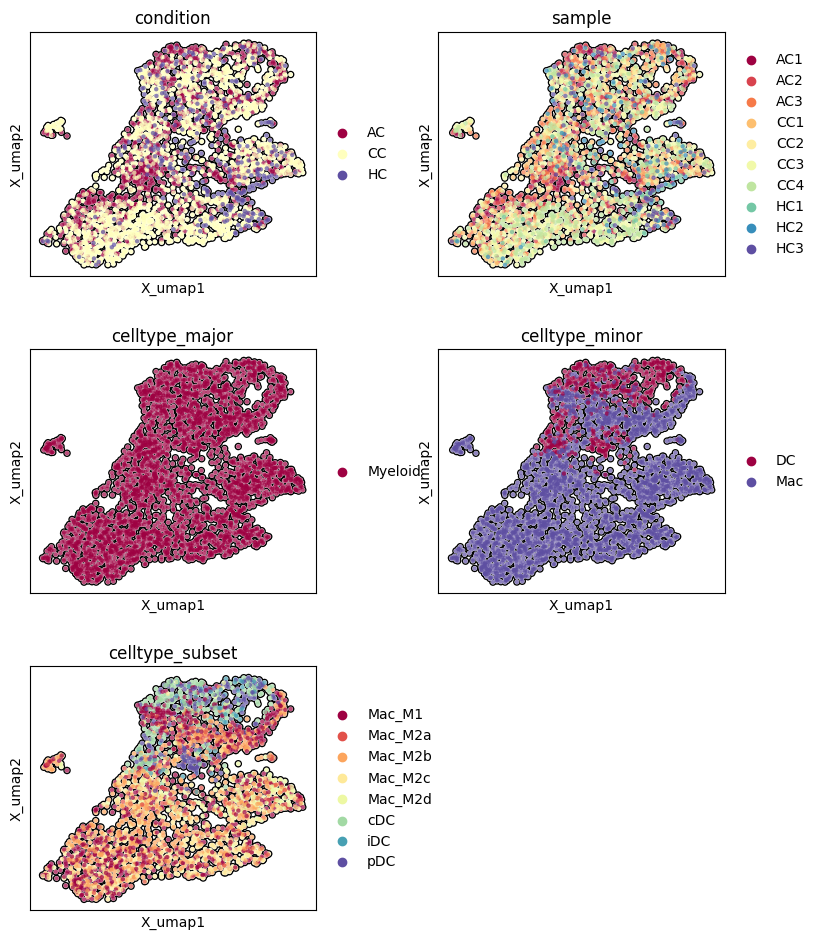

In [16]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

ws_hs = (0.3, 0.3)
plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

### __Celltype Population 확인__


,B cell,Dendritic cell,Endothelial cell,Fibroblast,ILC,Intestinal Epithelial cell,Macrophage,NK cell,Plasma cell,Smooth muscle cell,T cell CD4+,T cell CD8+,unassigned
AC AC1,10.6,1.5,18.3,35.6,5.1,1.3,5.6,0.0,0.2,13.2,8.2,0.4,0.0
AC AC2,15.6,1.1,15.9,27.6,4.8,0.5,7.1,0.1,0.2,10.1,16.6,0.7,0.0
AC AC3,33.6,2.1,9.1,8.3,5.0,1.0,7.7,0.0,1.0,4.9,26.8,0.5,0.0
CC CC1,60.1,1.8,5.0,3.6,2.2,0.7,6.4,0.0,4.1,6.5,9.4,0.2,0.0
CC CC2,59.9,1.1,5.3,2.6,1.4,2.0,4.7,0.0,5.9,6.4,10.5,0.2,0.0
CC CC3,33.1,2.0,10.9,11.8,3.6,2.7,14.5,0.2,2.4,5.7,13.2,0.0,0.0
CC CC4,23.9,2.2,14.5,19.3,4.8,2.0,10.7,0.3,1.6,8.5,12.2,0.1,0.0
HC HC1,11.5,0.2,9.9,24.3,5.1,25.2,2.0,0.0,1.0,8.6,12.1,0.2,0.0
HC HC2,46.1,0.7,5.9,13.5,4.0,4.7,2.0,0.0,1.7,4.8,16.5,0.3,0.0
HC HC3,24.1,0.5,10.8,23.5,5.0,10.8,2.3,0.0,2.7,8.1,12.0,0.2,0.1


<Figure size 350x350 with 0 Axes>

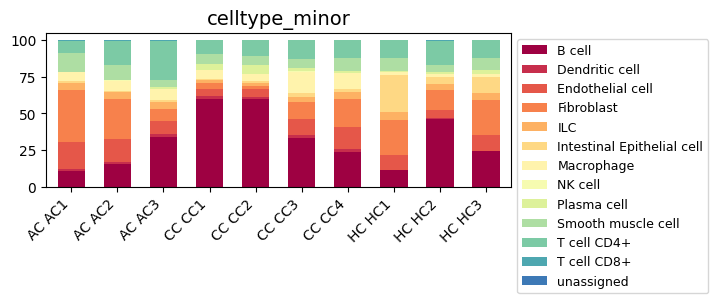

In [17]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population( adata_t.obs['sample_ext'],
                                adata_t.obs[celltype_col], sort_by = [] )
## 샘플별 세포 개수 확인
display(df_pct.round(1))

plot_population( df_pct, bar_width = 0.6,
                 title = celltype_col, title_fs = 14,
                 label_fs = 12, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
                 legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                 legend_ncol = 1, cmap_name = None, figsize=(6, 2), dpi = 100)

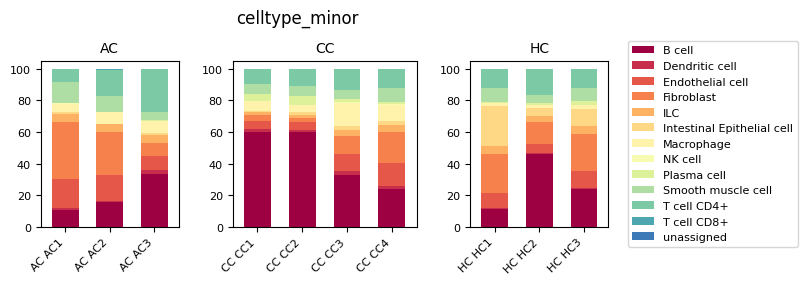

In [18]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population( adata_t.obs['sample_ext'],
                                adata_t.obs[celltype_col], sort_by = [] )

sample_group_map = adata_t.uns['lut_sample_to_cond']
plot_population_grouped( df_pct, sample_group_map, sort_by = [], bar_width = 0.6,
                         title = celltype_col, title_fs = 12, title_y_pos = 1.2,
                         label_fs = 10, tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'center left', bbox_to_anchor = (1.1,0.5),
                         legend_ncol = 1, cmap_name = None, figsize=(7, 2), dpi = 100,
                         wspace = 0.35, hspace = 0.2 )

In [ ]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

sample_group_map = adata_t.uns['lut_sample_to_cond']
df_res = test_group_diff( df_pct, sample_group_map, ref_group = None, pval_cutoff = 0.8 )
display(df_res)

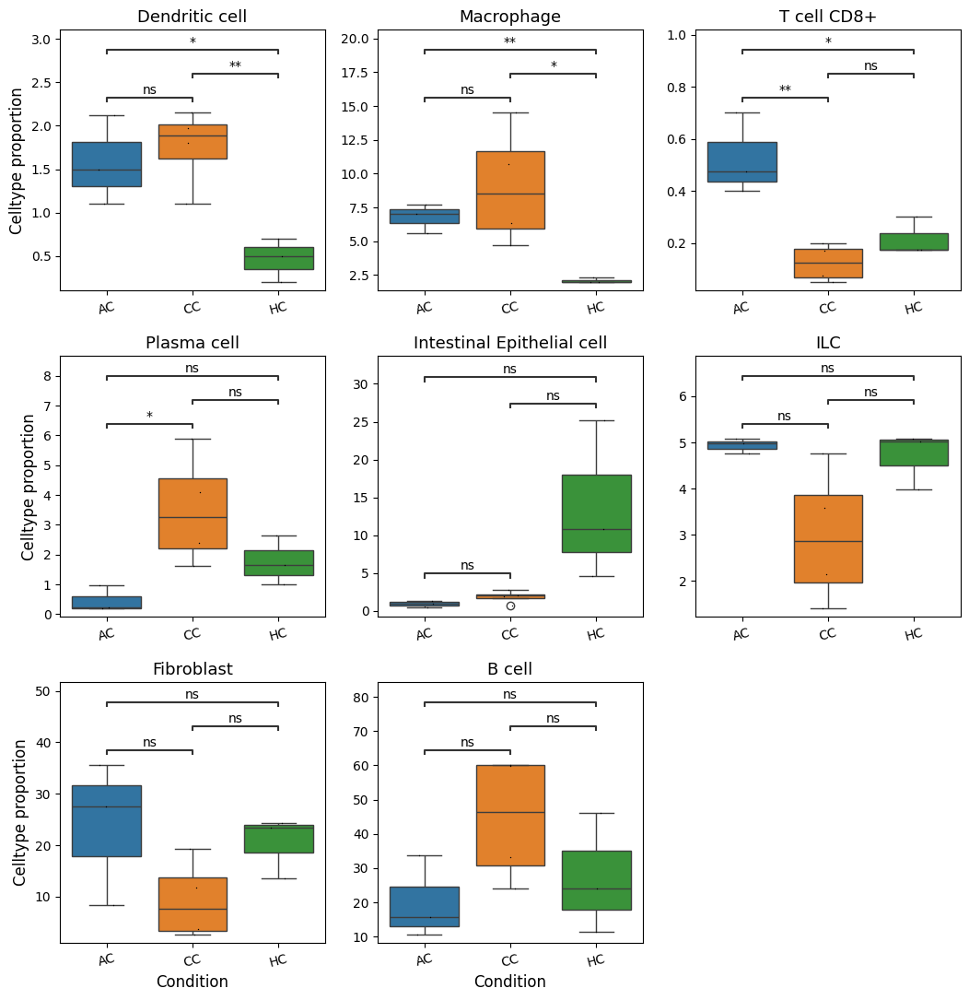

In [20]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel], sample_group_map, ylabel = 'Celltype proportion',
                 ncols = 3, figsize = (3.5,3.5), dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None, title_y_pos = 1.05, title_fs = 15,
                 label_fs = 12, tick_fs = 10, xtick_rot = 15,
                 annot_ref = None, annot_fmt = 'star', annot_fs = 10,
                 ws_hs = (0.2, 0.25), stripplot = True, cmap = 'tab10')

#### __특정 세포유형의 subset population 확인__

,Macrophage (M1),Macrophage (M2A),Macrophage (M2B),Macrophage (M2C),Macrophage (M2D)
AC AC1,83,12,89,21,18
AC AC2,96,12,109,44,21
AC AC3,96,20,104,60,27
CC CC1,95,8,81,48,23
CC CC2,51,6,42,27,10
CC CC3,223,32,181,106,38
CC CC4,140,29,144,86,29
HC HC1,16,3,32,18,10
HC HC2,19,11,25,11,13
HC HC3,23,9,22,25,13


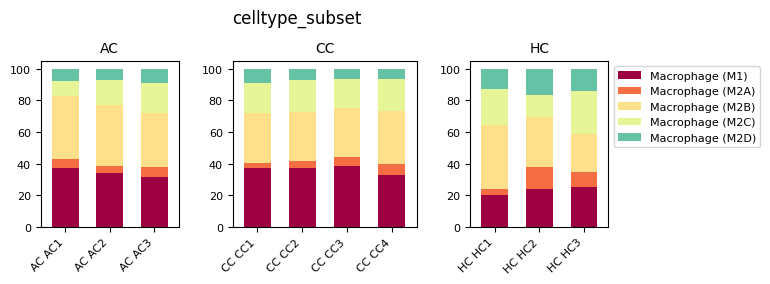

In [21]:
## 특정 세포유형의 subset별 상대비율을 얻기 위해 특정 세포 유형만 선택
## 이 경우 Macrophage subset의 상대비율을 보기 위해 먼저 minor type이 macrophage인 cell들만 선택
b = adata_t.obs['celltype_minor'] == 'Macrophage'
adata_s = adata_t[b,:]

sample_group_map = adata_t.uns['lut_sample_to_cond']

## 샘플별로 macrophage subset의 개수와 상대비율을 얻어서 데이터프레임에 저장
col = 'celltype_subset'
df_cnt, df_pct = get_population( adata_s.obs['sample_ext'], adata_s.obs[col], sort_by = [] )
display(df_cnt)

plot_population_grouped( df_pct, sample_group_map, sort_by = [],
                         title = col, title_fs = 12, title_y_pos = 1.2,
                         label_fs = 10, bar_width = 0.6,
                         tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'upper left',
                         bbox_to_anchor = (1,1), legend_ncol = 1,
                         cmap_name = None, figsize=(7, 2), wspace = 0.35, dpi = 100)

In [22]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

sample_group_map = adata_t.uns['lut_sample_to_cond']
df_res = test_group_diff( df_pct, sample_group_map, ref_group = None, pval_cutoff = 0.8 )
display(df_res)

,CC_vs_AC,HC_vs_AC,HC_vs_CC
Macrophage (M1),0.343468,0.008484,0.001461
Macrophage (M2D),0.364652,0.019939,0.010830
Macrophage (M2C),0.272239,0.262719,0.654676
Macrophage (M2A),0.693689,0.325915,0.286198
Macrophage (M2B),0.079992,0.377122,0.978428


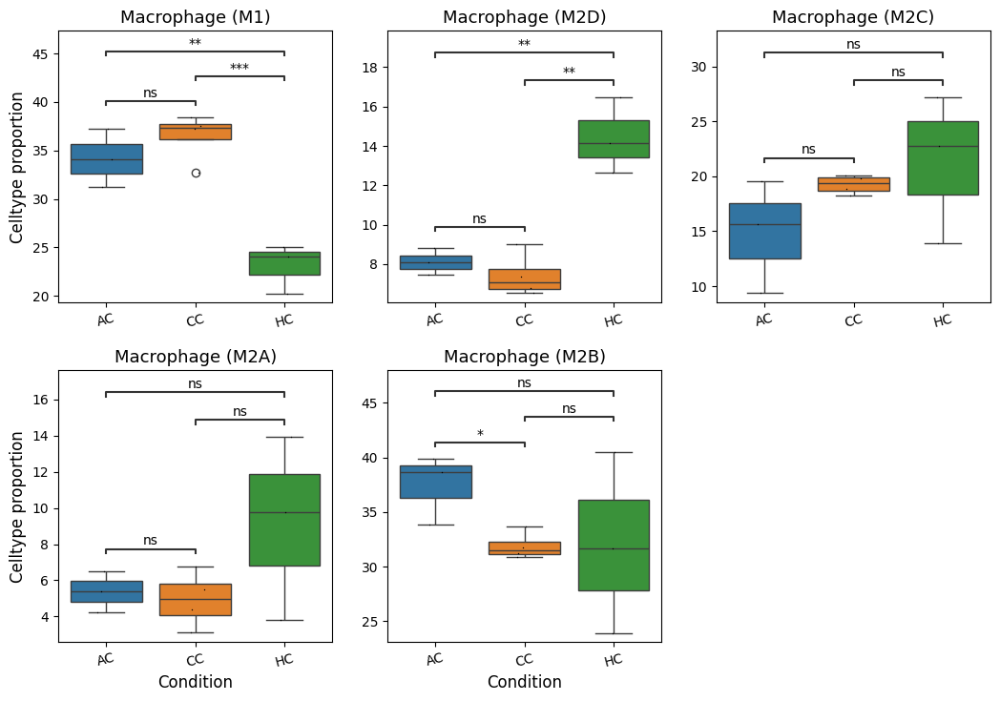

In [23]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel], sample_group_map, ylabel = 'Celltype proportion',
                 ncols = 3, figsize = (3.5,3.5), dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None, title_y_pos = 1.05, title_fs = 15,
                 label_fs = 12, tick_fs = 10, xtick_rot = 15,
                 annot_ref = None, annot_fmt = 'star', annot_fs = 10,
                 ws_hs = (0.2, 0.25), stripplot = True, cmap = 'tab10')

### This does not work since tumor identification was not performed for this dataset

In [24]:
# ## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
# b = adata_t.obs['tumor_origin_ind']
# adata_s = adata_t[b,:]

# ## 샘플별 세포 개수 확인
# sample_group_map = get_sample_to_group_map(adata_s.obs['sample'],
#                                            adata_s.obs['condition'])

# col = 'ploidy_dec'
# df_cnt, df_pct= get_population( adata_s.obs['sample'],
#                                 adata_s.obs[col], sort_by = [] )

# plot_population_grouped( df_pct, sample_group_map, sort_by = ['Aneuploid'], bar_width = 0.6,
#                  title = None, title_fs = 10, title_y_pos = 1.15, dpi = 120,
#                  label_fs = 9, tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
#                  legend_fs = 8, legend_loc = 'upper left', bbox_to_anchor = (1,1),
#                  legend_ncol = 1, cmap_name = None, figsize=(6, 1), wspace = 0.35)


### __CNV & tumor cell identification 결과__
#### <font color=blue>(This works only if you checked "Tumor cell Identification" box when running SCODA)</font>

- __InferCNVpy:__ https://infercnvpy.readthedocs.io/en/latest/infercnv.html
- __InferPloidy:__

#### CNV 패턴 확인

In [ ]:
## adata_t의 사본을 만들어서 adata에 저장
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음
adata = adata_t[:,:]

## cell들을 Grouping 하기 위해 obs 필드에 'cell_group' 열을 새로 정의
## 기본적으로 major type의 이름을 사용
adata.obs['cell_group'] = adata.obs['celltype_major'].copy(deep = True).astype(str)

## InferCNV에 사용된 reference 세포 유형들은 'Normal ref'로 이름 변경
b = adata.obs['cnv_ref_ind']
adata.obs.loc[b, 'cell_group'] = 'Normal ref'

## condition 열에 정의된 유방암 subtype에 따라 암세포로 식별된 세포들의
## 이름에 유방암 subtype을 추가하여 이름 변경
## 예: condition이 ER+인 샘플중 Tumor cell들은 이름을 'Tumor ER+'로 변경
cond_col = 'condition'
clst = adata.obs[cond_col].unique()
for c in clst:
    b = (adata.obs[cond_col] == c) & (adata.obs['ploidy_dec'] == 'Aneuploid')
    s = 'Aneuploid Epi in %s' % c
    adata.obs.loc[b, 'cell_group'] = s

## 'cell_group'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata, groupby = 'cell_group', N_cells_min = 200,
                title = 'log2(CNR)', title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 11,
                figsize = (15, 8), swap_axes = False,
                var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

#### Tumor cell로 식별된 세포들만 골라서 샘플별로 CNV 패턴 비교

In [ ]:
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cell_grouping = 'sample_ext_for_deg'

## cell_grouping열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata_s, groupby = cell_grouping, N_cells_min = 200,
                title = None, title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 10,
                figsize = (15, 10), swap_axes = False,
                var_group_rotation = 90, cmap='bwr', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

### Finding genomic spots where CNV has a peak

In [ ]:
## Select cells of interest
b = adata_t.obs['tumor_origin_ind']
adata_s = adata_t[b,:]

cnv_peaks = find_genomic_spots_of_cnv_peaks( adata_s, group_col = 'condition', width = 5, std_scale = 5, q = None )
cnv_peaks

In [ ]:
cnv_peaks['HER2+']

#### CNV 패턴을 UMAP 차원 축소하여 확인

In [ ]:
# adata = adata_t[:,:]

sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10, use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')
ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']
# sc.tl.leiden(adata, resolution = 4, neighbors_key = 'cnv_new', key_added = 'cnv_cluster')

In [ ]:
items_to_plot = ['condition', 'celltype_major', 'cnv_ref_ind', 'ploidy_dec', 'sample']

adata.obs['cnv_ref_ind'] = adata.obs['cnv_ref_ind'].astype(str)
adata.obs['tumor_origin_ind'] = adata.obs['tumor_origin_ind'].astype(str)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.35, legend_fontsize = 10,
                       ncols = 2, palette = 'Spectral', return_fig = False,
                       add_outline = True)

### __Cell-cell interaction 분석결과__
- 샘플별 CCI 결과와 조건별 CCI 결과가 따로 저장되어 있음
- 데이터 포맷은 두 결과가 동일함
- 조건별 CCI는 해당 조건에 포함된 샘플중 일정 퍼센트 이상의 샘플에서 공통적으로 확인된 것들만 추린 것임.

- __CellPhoneDB:__ https://www.cellphonedb.org/
- __CCI_sample__ data structure

##### __Cell-cell interaction 결과 데이터의 구성__

<div>
<img src="https://drive.google.com/uc?export=view&id=1091cGa6DqKSybzWSd6YE7amC2HDqNIn6" align="center" width="320"/>
</div>

<div>
<img src=attachment:48abf5fd-8f00-4f14-9a91-bb5b872d7275.png width="320"/>   
</div>

In [26]:
## 샘플 별 CCI 결과
cci_df_dct = adata_t.uns['CCI_sample']
sample_lst = list(cci_df_dct.keys())
sample_lst

['AC AC1',
 'AC AC2',
 'AC AC3',
 'CC CC1',
 'CC CC2',
 'CC CC3',
 'CC CC4',
 'HC HC1',
 'HC HC2',
 'HC HC3']

In [27]:
## CCI 결과의 형식
cci_df_dct[sample_lst[-1]].tail()

,gene_pair,cell_pair,gene_A,gene_B,cell_A,cell_B,pval,mean
TGFB1_TGFbeta_receptor2--T cell CD4+|Smooth muscle cell,TGFB1_TGFbeta_receptor2,T cell CD4+|Smooth muscle cell,TGFB1,TGFbeta_receptor2,T cell CD4+,Smooth muscle cell,0.024,0.435
LTB_LTBR--T cell CD4+|Smooth muscle cell,LTB_LTBR,T cell CD4+|Smooth muscle cell,LTB,LTBR,T cell CD4+,Smooth muscle cell,0.000,0.603
SELPLG_SELL--T cell CD4+|T cell CD4+,SELPLG_SELL,T cell CD4+|T cell CD4+,SELPLG,SELL,T cell CD4+,T cell CD4+,0.000,0.573
IFNG_Type_II_IFNR--T cell CD4+|T cell CD4+,IFNG_Type_II_IFNR,T cell CD4+|T cell CD4+,IFNG,Type_II_IFNR,T cell CD4+,T cell CD4+,0.000,0.396
SEMA4D_PTPRC--T cell CD4+|T cell CD4+,SEMA4D_PTPRC,T cell CD4+|T cell CD4+,SEMA4D,PTPRC,T cell CD4+,T cell CD4+,0.000,1.950


#### __각 샘플(조건)별 상세 내용__

In [28]:
cci_df_dct_per_cond = adata_t.uns['CCI']

4 cell_pairs, 101 gene_pairs found


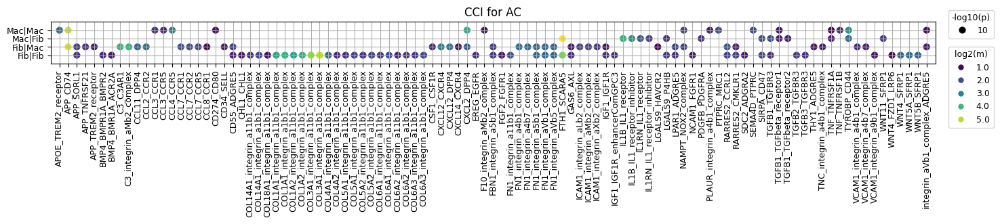

9 cell_pairs, 101 gene_pairs found


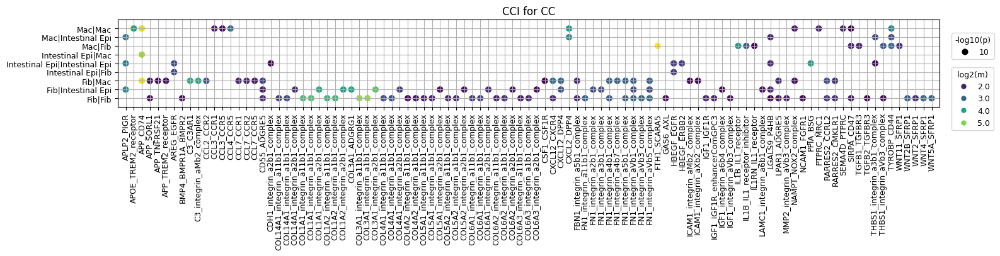

9 cell_pairs, 101 gene_pairs found


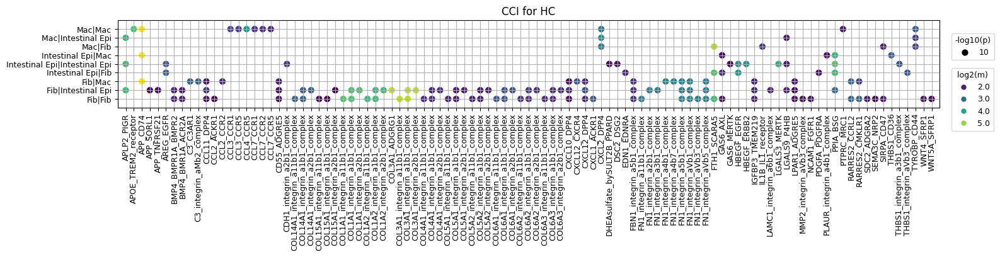

In [29]:
# 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Intestinal Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

ax = plot_cci_dot( cci_df_dct_per_cond, n_gene_pairs = 100,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.01,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = None ) # 'Reds')

In [30]:
b1 = adata_t.var_names.str.startswith('Ccl')
b2 = adata_t.var_names.str.startswith('Cxcl')
b3 = adata_t.var_names.str.startswith('Il')
genes_sel = list(adata_t.var.index.values[b1 | b2 | b3])
np.array(genes_sel)

array(['Il17a', 'Il17f', 'Il1r2', 'Il1r1', 'Il1rl2', 'Il1rl1', 'Il18r1',
       'Il18rap', 'Ccl20', 'Ilkap', 'Il24', 'Il19', 'Il10', 'Ildr2',
       'Il2ra', 'Il15ra', 'Il1f9', 'Il1f6', 'Il1rn', 'Il1a', 'Il1b',
       'Il1bos', 'Il7', 'Il2', 'Il21', 'Il12a', 'Il6ra', 'Ilf2',
       'Il11ra1', 'Ccl27a', 'Ccl19', 'Ccl21a', 'Il22ra1', 'Il6', 'Cxcl5',
       'Cxcl3', 'Cxcl1', 'Cxcl2', 'Cxcl9', 'Cxcl10', 'Cxcl13', 'Il31',
       'Ccl24', 'Il12rb2', 'Il23r', 'Il5ra', 'Il17re', 'Il17rc', 'Cxcl12',
       'Il17ra', 'Il11', 'Cxcl17', 'Il4i1', 'Il16', 'Il18bp', 'Ilk',
       'Il4ra', 'Il21r', 'Il27', 'Ccl25', 'Il12rb1', 'Il15', 'Il27ra',
       'Ccl22', 'Ccl17', 'Il34', 'Il17c', 'Ilf3', 'Il10ra', 'Il18',
       'Il20rb', 'Il22ra2', 'Il20ra', 'Ilvbl', 'Il22', 'Iltifb', 'Il23a',
       'Il9r', 'Il12b', 'Il4', 'Il13', 'Il5', 'Cxcl16', 'Ccl2', 'Ccl7',
       'Ccl11', 'Ccl12', 'Ccl8', 'Ccl1', 'Ccl5', 'Ccl9', 'Ccl6', 'Ccl3',
       'Ccl4', 'Cxcl14', 'Il6st', 'Il31ra', 'Ccl28', 'Il3ra', 'Il17rd',
     

4 cell_pairs, 27 gene_pairs found


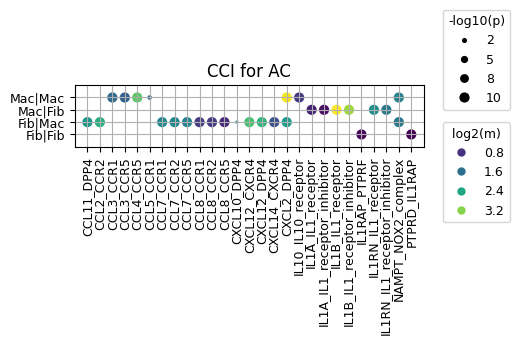

8 cell_pairs, 29 gene_pairs found


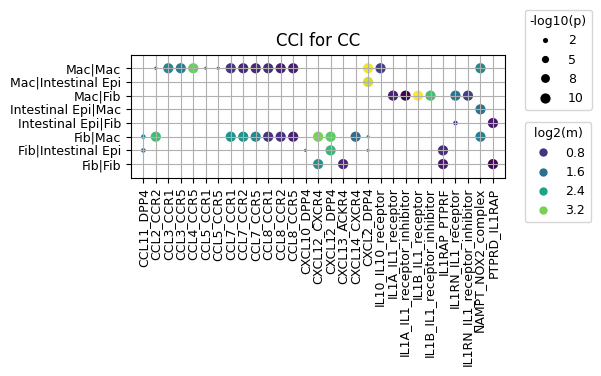

8 cell_pairs, 24 gene_pairs found


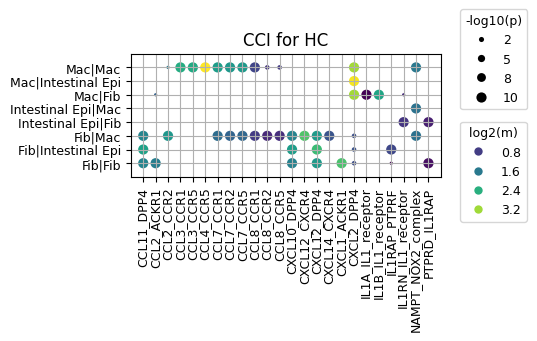

In [31]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = []
target_cells = ['Intestinal Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = [g.upper() for g in genes_sel] + ['NAMPT']
## CellPhoneDB가 제공하는 유전자명은 Human 기준임 -> 마우스 데이터의 경우 유전자 이름을 대문자로 수정해야 함.

ax = plot_cci_dot( cci_df_dct_per_cond, n_gene_pairs = 60,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.01,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = None ) # 'Reds')

9 cell_pairs, 81 gene_pairs found


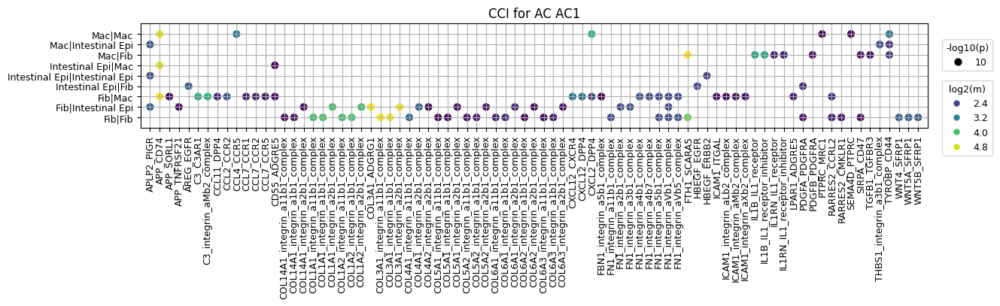

4 cell_pairs, 81 gene_pairs found


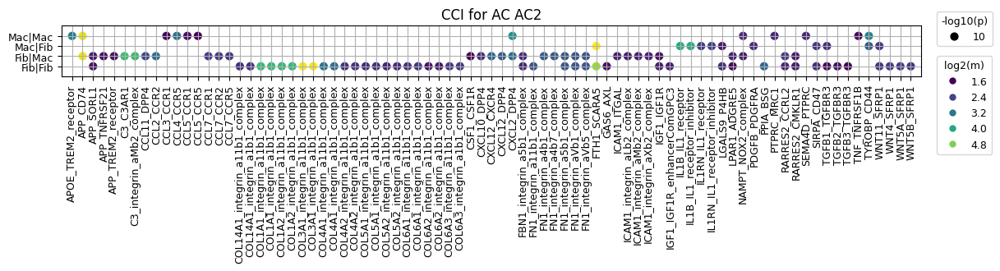

4 cell_pairs, 81 gene_pairs found


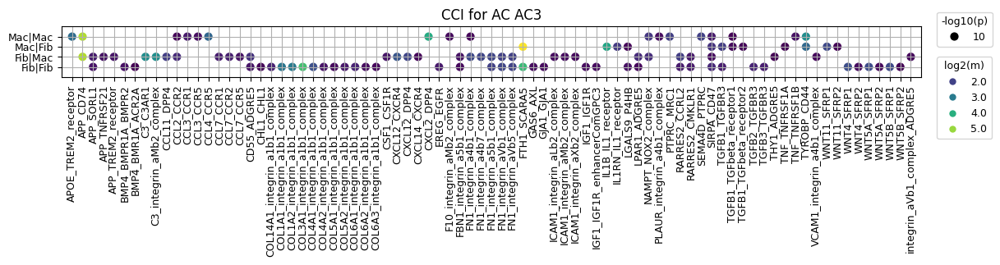

4 cell_pairs, 81 gene_pairs found


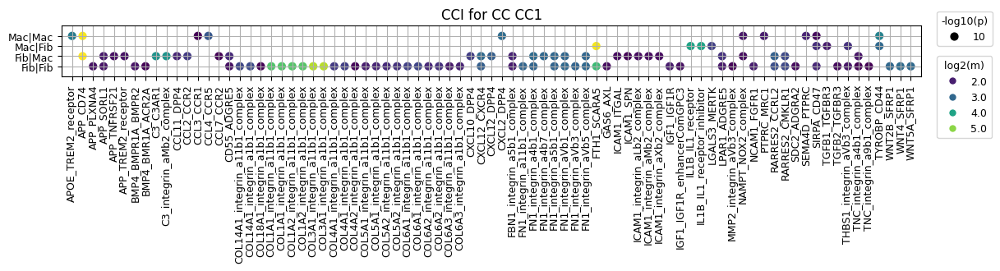

9 cell_pairs, 81 gene_pairs found


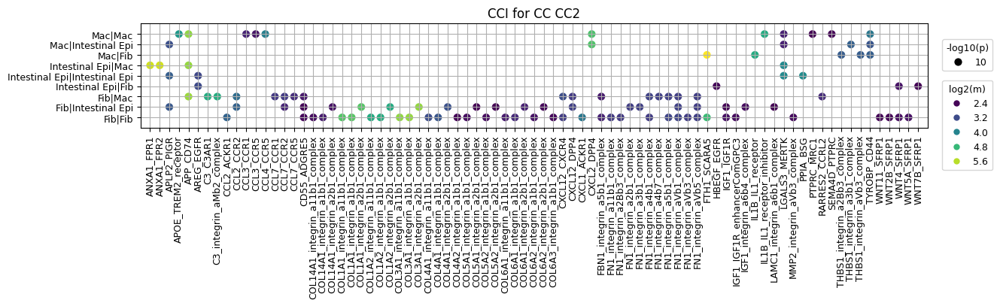

9 cell_pairs, 81 gene_pairs found


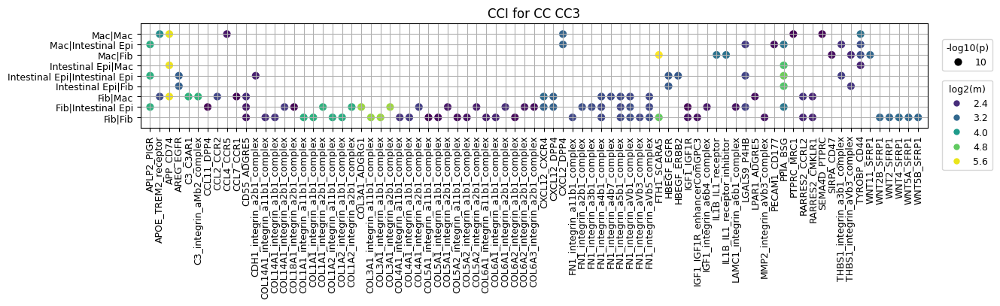

9 cell_pairs, 81 gene_pairs found


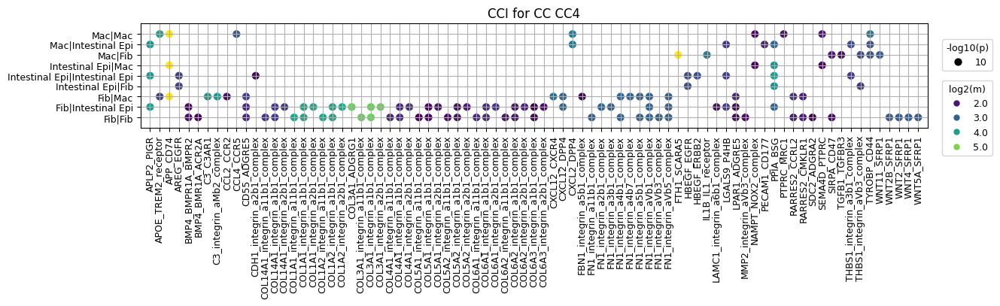

9 cell_pairs, 81 gene_pairs found


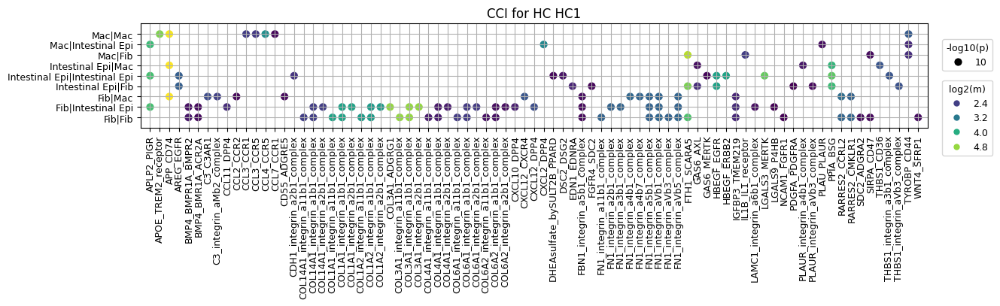

9 cell_pairs, 81 gene_pairs found


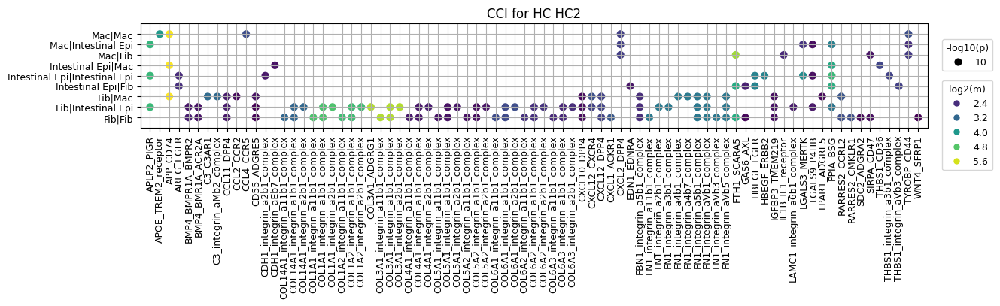

9 cell_pairs, 81 gene_pairs found


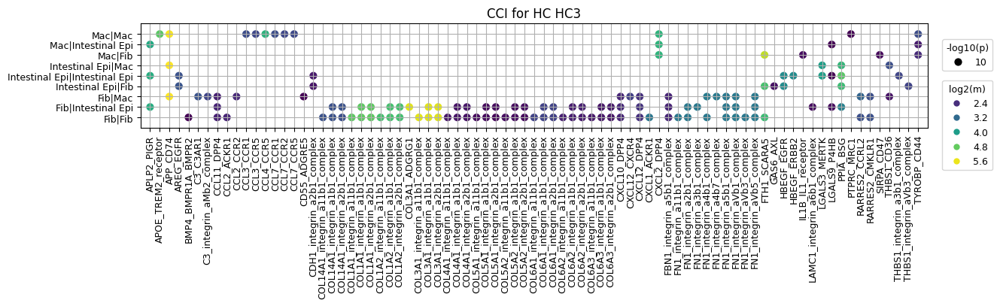

In [32]:
cci_df_dct = adata_t.uns['CCI_sample']

## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Intestinal Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

ax = plot_cci_dot( cci_df_dct, n_gene_pairs = 80,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.01,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = None ) # 'Reds')

#### __CCI mean difference between conditions__
샘플별 CCI 결과에서 모든 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [33]:
cci_df_dct = adata_t.uns['CCI_sample']
target_cells = ['Macrophage']
target_genes = []

sample_group_map = adata_t.uns['lut_sample_to_cond']

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df_cci = get_cci_means( cci_df_dct, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.1 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df_cci, sample_group_map, ref_group = None, pval_cutoff = 0.05 )
df_res

,CC_vs_AC,HC_vs_AC,HC_vs_CC
SELPLG_SELP--Macrophage|Endothelial cell,0.002310,0.002031,0.000880
THY1_ADGRE5--T cell CD4+|Macrophage,0.012395,0.018510,0.000600
VCAM1_integrin_a4b1_complex--Endothelial cell|Macrophage,0.017868,0.043521,0.000683
RARRES2_CCRL2--Fibroblast|Macrophage,0.041004,0.000834,0.039814
CXCL10_DPP4--Endothelial cell|Macrophage,0.043709,0.041391,0.004398
...,...,...,...
TNF_TNFRSF1A--Macrophage|Dendritic cell,0.044516,1.000000,1.000000
TGFB1_TGFbeta_receptor1--Macrophage|Plasma cell,1.000000,1.000000,0.044759
LGALS9_P4HB--Macrophage|Intestinal Epithelial cell,1.000000,1.000000,0.045412
CD34_SELL--Fibroblast|Macrophage,0.047013,1.000000,1.000000


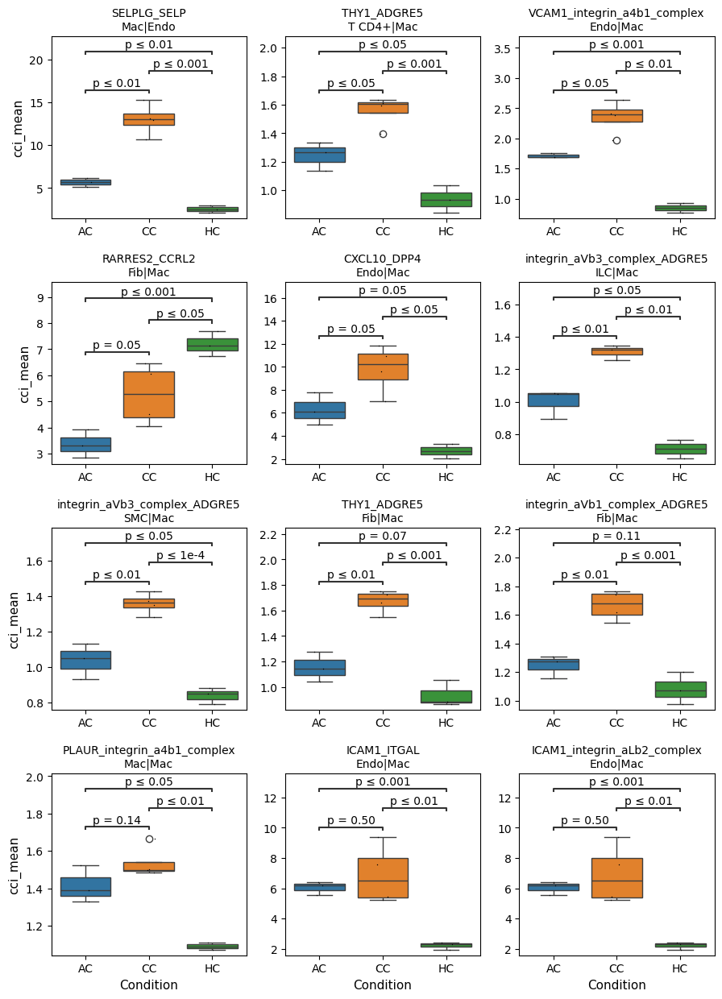

In [34]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 4개만
num_items_to_plot = 12
idx_sel = df_res.index.values.tolist()[:num_items_to_plot]

if len(idx_sel) > 0:
    rend = rename_dict['celltype_minor']
    plot_pct_box(df_cci[idx_sel], sample_group_map, ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3), dpi = 100, rename_cells = rend,
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 11, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.2, 0.35), stripplot = True)

#### __CCI mean difference between conditions (specifying some genes to consider)__
샘플별 CCI 결과에서 여러 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [35]:
cci_df_dct = adata_t.uns['CCI_sample']
target_cells = ['Macrophage']
target_genes = ['IL1B', 'NAMPT']

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df_cci = get_cci_means( cci_df_dct, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.2 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df_cci, sample_group_map, ref_group = None, pval_cutoff = 0.5 )
df_res

,CC_vs_AC,HC_vs_AC,HC_vs_CC
IL1B_IL1_receptor--Macrophage|Smooth muscle cell,0.269857,0.110341,0.000907
NAMPT_NOX2_complex--Endothelial cell|Macrophage,0.429213,0.046913,0.026341
NAMPT_NOX2_complex--Macrophage|Macrophage,0.473107,0.130282,0.039560
NAMPT_NOX2_complex--Macrophage|B cell,0.196695,0.073747,0.171191
NAMPT_NOX2_complex--Smooth muscle cell|Macrophage,0.462637,0.125473,0.067571
NAMPT_NOX2_complex--Fibroblast|Macrophage,0.467046,0.141547,0.070554
IL1B_IL1_receptor--Macrophage|Fibroblast,0.786983,0.007567,0.046075
NAMPT_NOX2_complex--B cell|Macrophage,0.524412,0.104027,0.060452
NAMPT_NOX2_complex--T cell CD4+|Macrophage,0.994235,0.416314,0.008540
NAMPT_NOX2_complex--ILC|Macrophage,0.898089,0.402530,0.065955


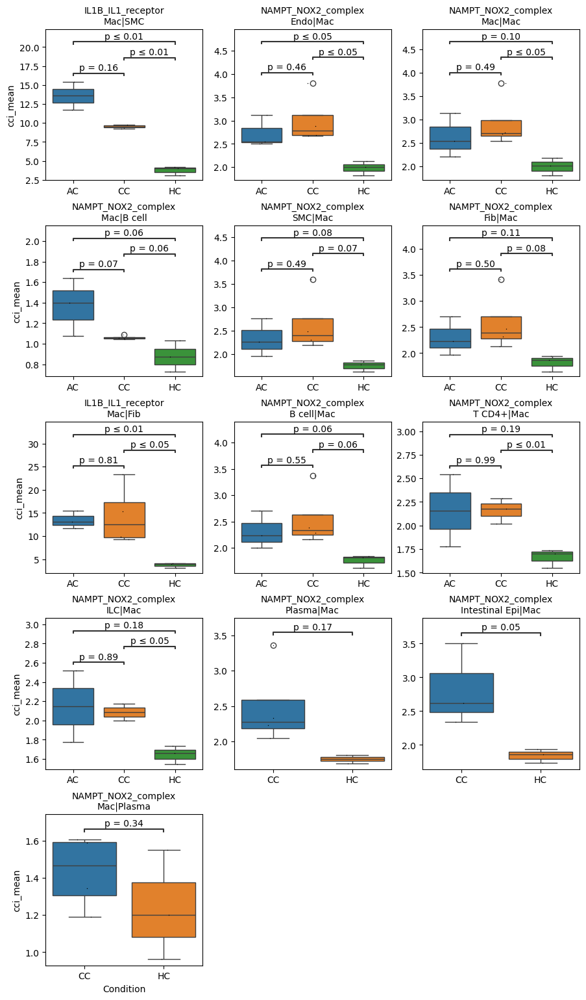

In [36]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 4개만
idx_sel = df_res.index.values.tolist()

if len(idx_sel) > 0:
    rend = rename_dict['celltype_minor']
    plot_pct_box(df_cci[idx_sel], sample_group_map, ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3), dpi = 100, rename_cells = rend,
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 10, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.2, 0.3), stripplot = True)

#### __cell-cell interactions pattern per sample__

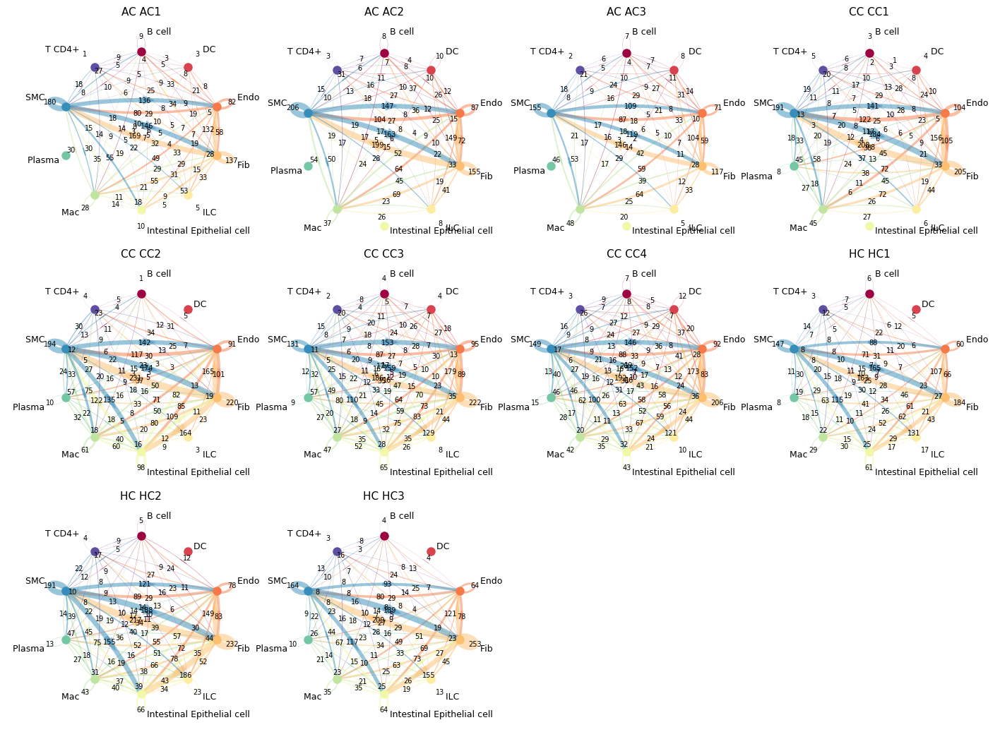

In [37]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
cci_df_dct = adata_t.uns['CCI_sample']

## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
rend = rename_dict['celltype_minor']

plot_cci_circ_group( cci_df_dct, target = None,
                     rename_cells = rend, remove_common = False,
                     ncol = 4, figsize = (3.5,3.5), dpi = 100,
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

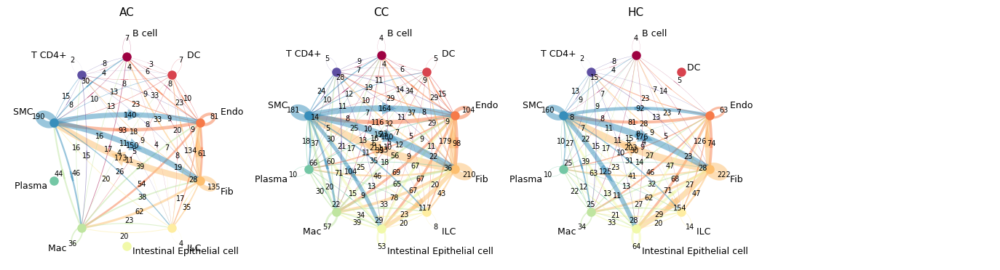

In [38]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
cci_df_dct = adata_t.uns['CCI']

## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
rend = rename_dict['celltype_minor']

plot_cci_circ_group( cci_df_dct, target = None,
                     rename_cells = rend, remove_common = False,
                     ncol = 4, figsize = (3.5,3.5), dpi = 100,
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.25, hspace = 0.1 )

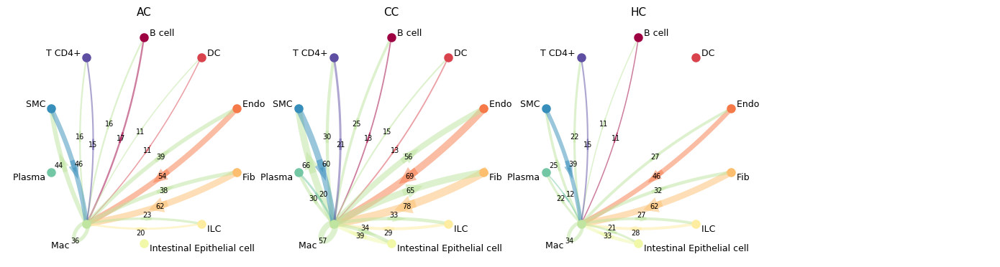

In [39]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
cci_df_dct = adata_t.uns['CCI']

## 특정 세포유형을 중심으로 CCI 개수 확인 (이 경우 Epithelial cell을 중심으로 봄)
target = ['Mac']

## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
rend = rename_dict['celltype_minor']

plot_cci_circ_group( cci_df_dct, target = target,
                     rename_cells = rend, remove_common = False,
                     ncol = 4, figsize = (3.5,3.5), dpi = 100,
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

### __DEG 분석결과__
- DEG 결과는 각 세포 유형별로 처리되어 저장됨
- major, minor, subset 중 어느 수준을 기준으로 할지는 analysis_parameters에서 정의 할 수 있음
- 현재의 결과는 celltype_minor 기준으로 세포 유형별로 condition-specific DEG를 얻은 결과 임.

In [40]:
adata_t

AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

In [41]:
nc_deg_dct_of_dct = adata_t.uns['DEG_stat'] ## DEG 분석에 사용된 셀수 정보
df_deg_dct_of_dct = adata_t.uns['DEG'] ## DEG 분석 결과

## 어떤 세포 유형들에 대한 DEG 결과가 있는지 확인
list(df_deg_dct_of_dct.keys())

## analysis_parameters에 정의한 DEG분석을 위한 최소 셀수(MIN_NUM_CELLS_FOR_DEG)보다
## 적은 셀수를 갖는 세포 유형에 대해서는 DEG 분석이 수행 되지 않음.
## (각 조건 별로 해당 유형의 셀수가 최소한 MIN_NUM_CELLS_FOR_DEG 정도되어야 DEG 분석이 수행됨)

['B cell',
 'Dendritic cell',
 'Endothelial cell',
 'Fibroblast',
 'ILC',
 'Intestinal Epithelial cell',
 'Macrophage',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+']

##### __DEG 결과 데이터의 구성__

<div>
<img src="https://drive.google.com/uc?export=view&id=1N-XeRpAvUAlnuryLpll7sYyzGbKGK5eG" align="center" width="500"/>
</div>

<div>
<img src=attachment:f57fafbd-8253-4210-88ed-9acbc3224d08.png width="500"/>   
</div>

In [42]:
## 특정 세포 유형에 대한 DEG 분석 결과를 가져옴 (이경우 Epithelial cell)
target_cell = 'Macrophage'

df_deg_dct = df_deg_dct_of_dct[target_cell]
nc_deg_dct = nc_deg_dct_of_dct[target_cell]

## 해당 세포 유형에 사용된 조건 별 셀수 확인
nc_deg_dct

{'AC_vs_others': {'AC': 600, 'others': 986},
 'CC_vs_others': {'CC': 736, 'others': 850},
 'HC_vs_others': {'HC': 250, 'others': 1336}}

In [43]:
df_deg_dct['CC_vs_others'].head()

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,gene,Rp
Ighg2b,3.227,3.632093e-39,2.800707e-35,1.024235,0.174525,0.444293,0.091667,0.403567,Ighg2b,1.0
Cebpb,1.298,2.449919e-13,1.923186e-09,2.542544,1.751259,0.722826,0.526667,0.342138,Cebpb,1.0
Gm10076,0.713,5.276880e-07,4.069002e-03,0.895209,0.633146,0.531250,0.388333,0.324948,Gm10076,1.0
Ighm,1.254,1.215998e-08,9.545583e-05,1.125376,0.627348,0.494565,0.344000,0.324435,Ighm,1.0
Mpc1,0.843,5.050746e-06,3.964836e-02,0.958751,0.639996,0.516304,0.375000,0.322690,Mpc1,1.0


- nz_pct_score = nz_pct_test*(1-nz_pct_ref)
- nz_pct_test: percentage of cells with the gene expressed in test group
- nz_pct_ref: percentage of cells with the gene expressed in reference group

##### __DEG 분석결과 확인__

Macrophage


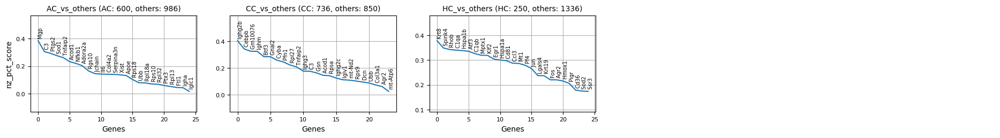

In [44]:
key = target_cell
df_deg_dct = df_deg_dct_of_dct[key]
nc_deg_dct = nc_deg_dct_of_dct[key]

n_genes_to_show = 25

print(key)
plot_deg( df_deg_dct, reference = 'nz_pct_score',
          n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
          figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
          tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
          deg_stat_dct = nc_deg_dct, show_log_pv = False )


AC_vs_others


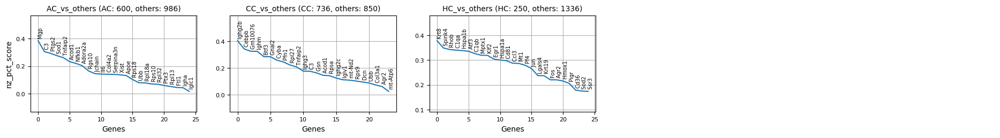

CC_vs_others


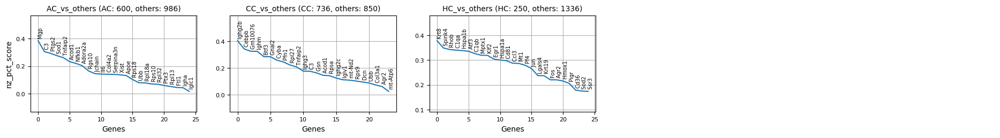

HC_vs_others


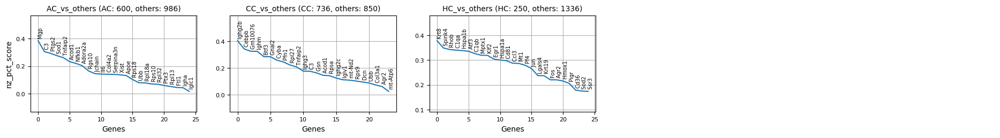

In [45]:
n_genes_to_show = 25

for key in df_deg_dct.keys():
    df_deg = df_deg_dct[key]
    nc_deg = nc_deg_dct[key]

    print(key)
    plot_deg( df_deg_dct, reference = 'nz_pct_score',
              n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
              figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
              tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
              deg_stat_dct = nc_deg_dct, show_log_pv = False )


##### __세포유형별로 조건특이적인 마커 탐색하기__

In [46]:
adata_t

AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

In [47]:
nc_deg_dct_of_dct = adata_t.uns['DEG_stat']
df_deg_dct_of_dct = adata_t.uns['DEG']
df_deg_dct_of_dct.keys()

dict_keys(['B cell', 'Dendritic cell', 'Endothelial cell', 'Fibroblast', 'ILC', 'Intestinal Epithelial cell', 'Macrophage', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+'])

In [48]:
# target_cell = 'Fibroblast'
# target_cell = 'Macrophage'
target_cell = 'Macrophage'
# target_cell = 'Aneuploid Epithelial cell'

df_deg_lst = df_deg_dct_of_dct[target_cell]

mkr_dict, df_deg_dct_updated = find_condition_specific_markers( df_deg_lst,
                                            score_col = 'log2_FC',
                                            n_markers_max = 60,
                                            score_cutoff = 0.2,
                                            pval_cutoff = 0.05,
                                            nz_pct_fc_cutoff = 1.2,
                                            surfaceome_only = True,
                                            verbose = True )

## Print results
for key in mkr_dict.keys():
    mkr_dict[key].sort()
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])

N_markers: 
   AC_vs_others (7371 -> 108) 
   CC_vs_others (7586 -> 439) 
   HC_vs_others (7510 -> 209)
N_markers_selected: AC (60), CC (60), HC (60)
AC (60):  ['AI504432', 'Acod1', 'Adora2a', 'Akap7', 'Arhgap23', 'Atg16l1', 'Bcr', 'C3', 'Cass4', 'Ccdc88c', 'Clcf1', 'Col18a1', 'Col4a1', 'Col4a2', 'Col6a3', 'Crispld2', 'Cxcl1', 'Cxcl3', 'D930016D06Rik', 'Egr2', 'Eid3', 'Eln', 'F730043M19Rik', 'Fabp4', 'Flrt3', 'Flt1', 'Gem', 'Gm47644', 'Ifi205', 'Ifi206', 'Igfbp5', 'Il15ra', 'Il23a', 'Il6', 'Lamc1', 'Lnx2', 'Ly6c1', 'Met', 'Mfsd7a', 'Mgp', 'Mmp2', 'Mre11a', 'Pakap-1', 'Pdpn', 'Ppp1r16a', 'Ptges', 'Ptgs2', 'Ptx3', 'Rgs5', 'Rnd1', 'Serinc5', 'Serpina3n', 'Serping1', 'Sfrp1', 'Smad5', 'Sparcl1', 'Spon2', 'Usb1', 'Vcan', 'Vps39']
CC (60):  ['0610030E20Rik', 'Asb8', 'B3gnt8', 'Borcs8', 'Btf3', 'Card9', 'Cd79a', 'Cdk5rap1', 'Cebpb', 'Chchd4', 'Chil3', 'Coa4', 'Cpox', 'Dhx34', 'Dnajb11', 'Eif2ak3', 'Fbxl12', 'Gm14548', 'Hells', 'Ighg1', 'Ighg2b', 'Ighg2c', 'Ighg3', 'Ighm', 'Iglc2', 'Iglv1', 'I

Num markers selected: 60 -> 60


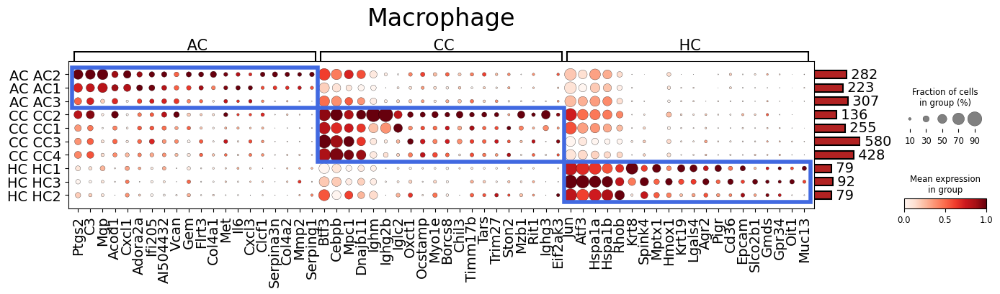

In [49]:
title = target_cell

plot_marker_exp(adata_t, markers = mkr_dict, celltype_selection = target_cell,
                N_cells_per_group_min = 40, N_markers_per_group_max = 20, N_markers_total = 140,
                title = title, title_y_pos = 2, title_fs = 24, text_fs = 14,
                linewidth = 4, var_group_height = 1.2, var_group_rotation = 0,
                standard_scale = 'var', nz_frac_max = 0.9, nz_frac_cutoff = 0.05,
                rem_mkrs_common_in_N_groups_or_more = 3, legend = True,
                figsize = (16, 2), swap_ax = False, add_rect = True )

##### __특정 마커들에 대한 violin plot 확인__

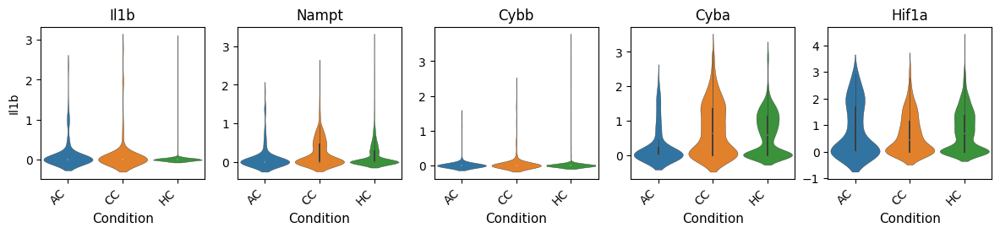

In [50]:
items_to_plot = ['Il1b', 'Nampt', 'Cybb', 'Cyba', 'Hif1a']

b = adata_t.obs['celltype_major'] == 'Epithelial cell'
adata_s = adata_t[b,:]

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata_s, target_sum=1e4)
sc.pp.log1p(adata_s)

df = adata_s[:, items_to_plot].to_df()
df['group'] = adata_s.obs['condition']

plot_violin( df, genes_lst = items_to_plot, group_col = 'group', scale = 'width',
             group_order = None, inner = 'box', width = 0.9, linewidth = 0.3, bw = 'scott',
             figsize = (2.5,2), dpi = 100,
             text_fs = 10, title = None, title_fs = 14, title_y_pos = 1,
             label_fs = 11, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
             ncols = 5, wspace = 0.2, hspace = 0.3, cmap = 'tab10' )

##### __조건별로 유의하게 발현량 차이를 보이는 유전자들 확인__
- 요부분은 sample 별 Gene expression의 평균이 조건별로 유의하게 차이가 나는지 확인하는 부분입니다. (위 코드셀의 결과가 사용됩니다)
- 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고 sample이 많을 수록 통계적 유의성이 커짐. (p-value가 작아짐)

In [51]:
df_all = get_gene_expression_mean( adata_s, genes = [], group_col = 'sample_ext' )
df_res = test_group_diff( df_all, sample_group_map,
                          ref_group = None, pval_cutoff = 0.05 )

display(df_res)

,CC_vs_AC,HC_vs_AC,HC_vs_CC
D130020L05Rik,0.000016,0.004188,0.020920
Rgcc,0.002813,0.000080,0.006466
Tppp,0.008958,0.000623,0.001651
Rcl1,0.000301,0.000954,0.040296
Srprb,0.000128,0.004310,0.031792
...,...,...,...
Dennd6b,0.473130,0.942052,0.042199
Ppp1r18os,0.422650,0.974319,0.048574
Igflr1,0.533824,0.958996,0.040169
Phc1,0.737902,0.912150,0.032948


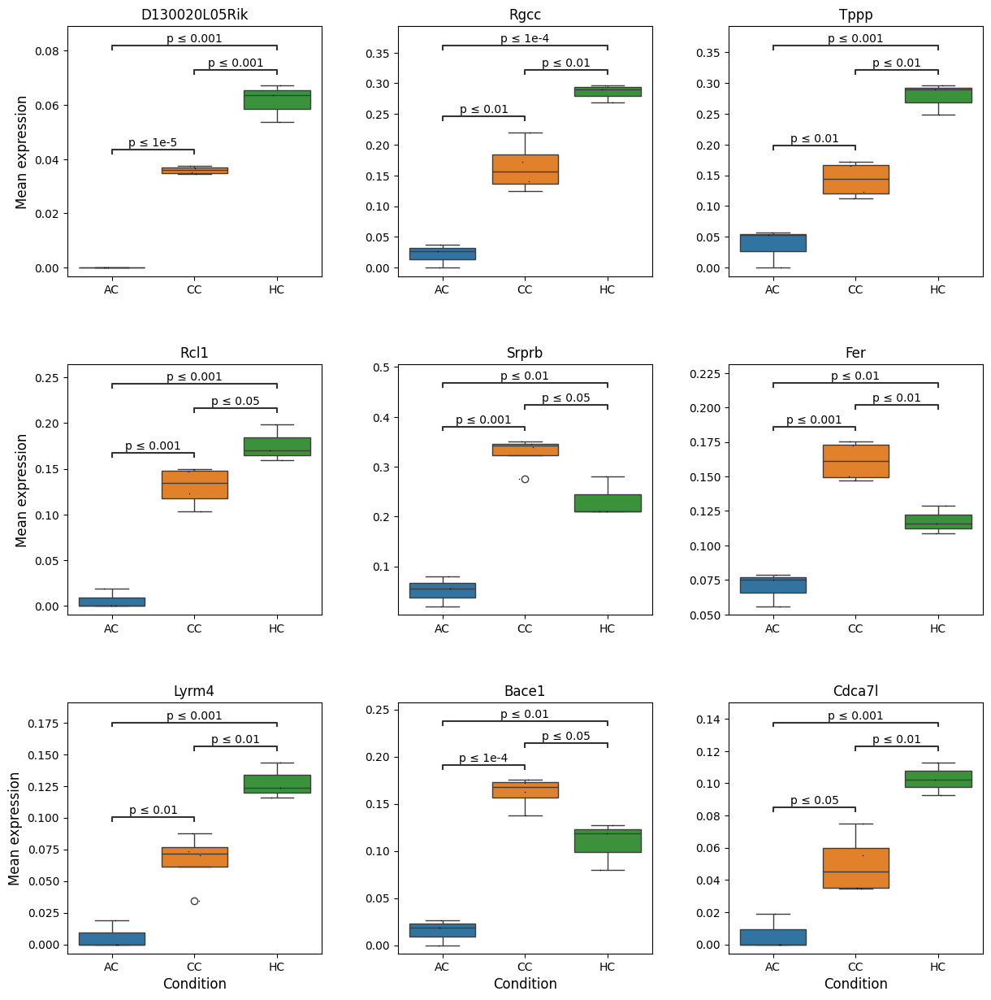

In [52]:
num_items_to_plot = 9
items_to_plot = df_res.iloc[:num_items_to_plot].index.values.tolist()

## Show the first 5 CCIs
plot_pct_box( df_all[items_to_plot],
              sample_group_map, ylabel = 'Mean expression',
              ncols = 3, figsize = (4,4), dpi = 100,
              title = None, title_y_pos = 1.05, title_fs = 14,
              label_fs = 12, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.3, 0.35), stripplot = True)

##### __유전자를 정해서 해당 유전자들이 조건별로 발현량 차이를 보이는지 확인__

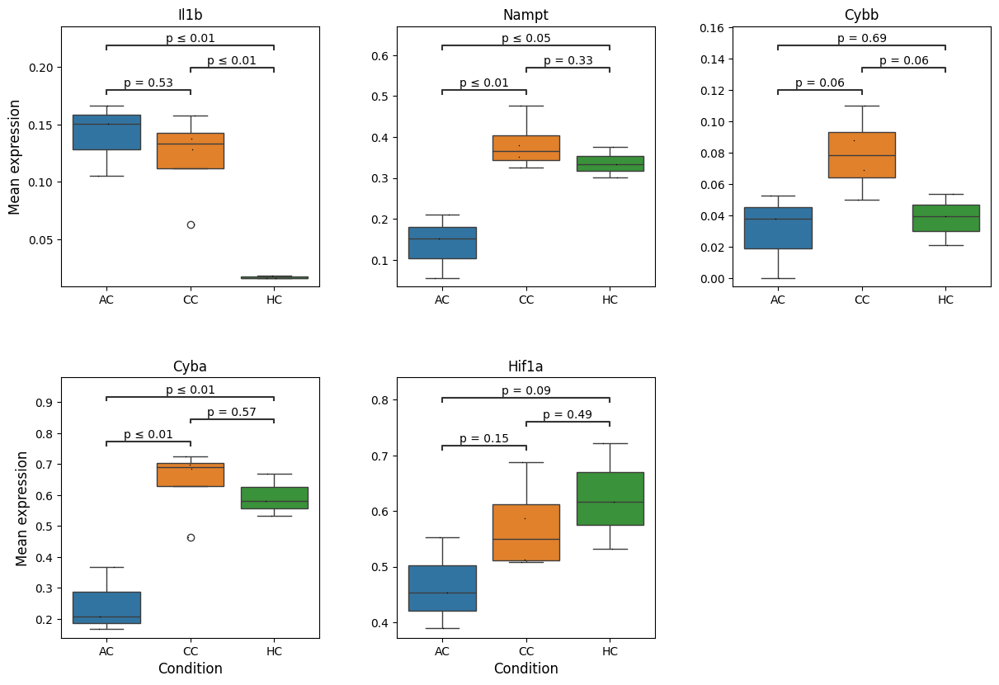

In [53]:
items_to_plot = ['Il1b', 'Nampt', 'Cybb', 'Cyba', 'Hif1a']

plot_pct_box(df_all[items_to_plot],
             sample_group_map, ylabel = 'Mean expression',
             ncols = 3, figsize = (4,4), dpi = 100,
             title = None, title_y_pos = 1.05, title_fs = 14,
             label_fs = 12, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
             annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
             ws_hs = (0.3, 0.35), stripplot = True)

### __GSA 분석결과__

In [54]:
gsa_res_up = adata_t.uns['GSA_vs_ref_up']
gsa_res_dn = adata_t.uns['GSA_vs_ref_down']

list(gsa_res_up.keys())

['B cell',
 'Endothelial cell',
 'Fibroblast',
 'ILC',
 'Intestinal Epithelial cell',
 'Macrophage',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+']

##### __GSA/GSEA 결과 데이터의 구성__

<div>
<img src="https://drive.google.com/uc?export=view&id=1RrmkpkWCI1rcfW5cIBfKvip-lX3lkJRL" align="center" width="500"/>
</div>

<div>
<img src=attachment:1369afc9-25a8-4811-bc55-41e7c61309af.png width="500"/>   
</div>

In [55]:
gsa_res = gsa_res_up
target_cell = 'Macrophage'

gsa_keys = list(gsa_res[target_cell].keys())
list(gsa_keys)

['AC_vs_HC', 'CC_vs_HC', 'HC_vs_others']

##### __GSA 결과 포맷__

In [56]:
gsa_res[target_cell][gsa_keys[2]].head()

,pval,pval_adj,genes,overlap,pw_size,-log(p-val),-log(q-val),Term,Ind
AGE-RAGE signaling pathway in diabetic complications,0.000001,0.023004,Tnf;Col1a1;Jun;Plcb4;Tgfbr2;Col1a2;Col3a1;Ccl2...,15,101,5.951683,1.638195,AGE-RAGE signaling pathway in diabetic complic...,1
Adherens junction,0.089483,1.000000,Cdh1;Acp1;Tgfbr2;Baiap2;Tgfbr1,5,72,1.048259,0.000000,Adherens junction,1
Amino sugar and nucleotide sugar metabolism,0.001070,1.000000,Gmds;Hk2;Hexb;Pmm1;Npl;Gnpnat1;Nans,7,49,2.970480,0.000000,Amino sugar and nucleotide sugar metabolism,1
Amoebiasis,0.000198,1.000000,Serpinb1a;Tnf;Col1a1;Plcb4;Col3a1;Muc2;Gna15;R...,12,106,3.702996,0.000000,Amoebiasis,1
Amphetamine addiction,0.001755,1.000000,Arc;Jun;Fosb;Calm2;Fos;Sirt1;Creb5;Maoa,8,68,2.755688,0.000000,Amphetamine addiction,1


##### __특정 세포 유형에 대한 GSA 결과 확인__

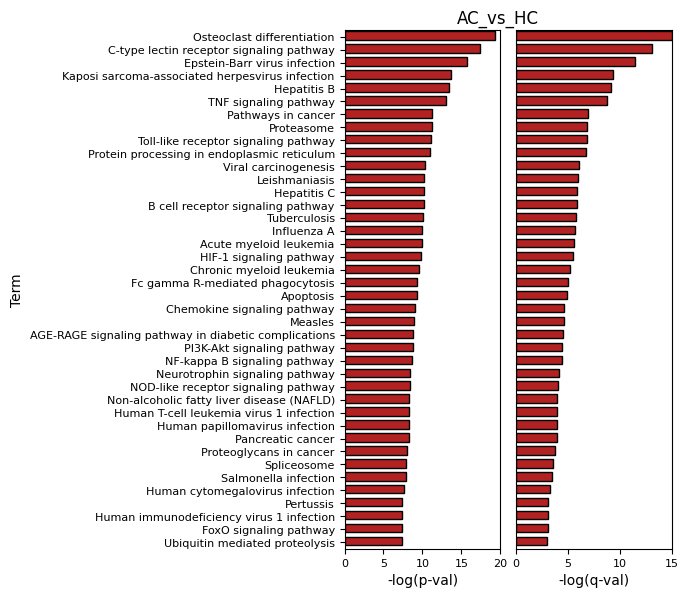

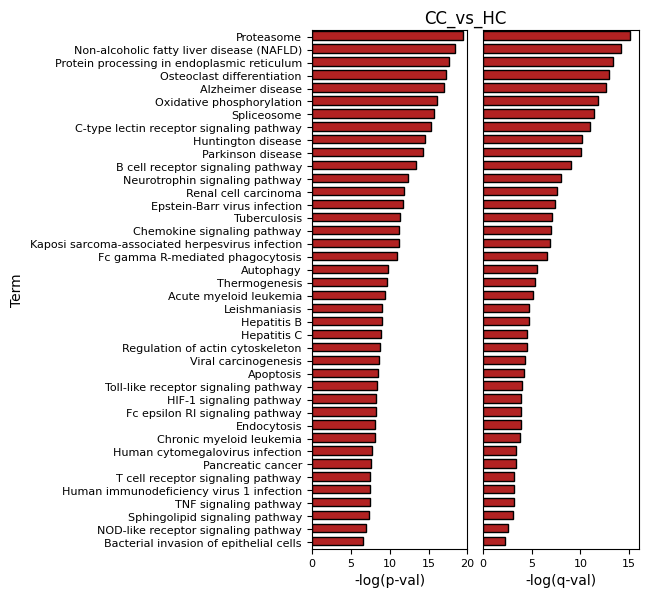

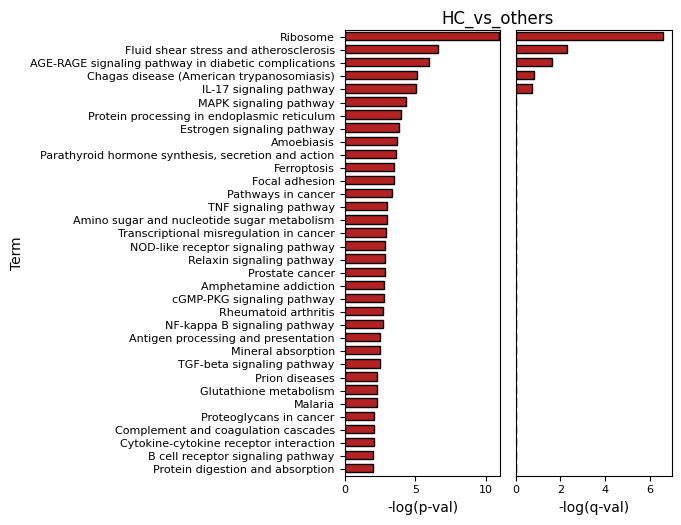

In [57]:
target_cell = 'Macrophage'

df_gsa_dct = gsa_res[target_cell]

df_sel_dct = plot_gsa_bar( df_gsa_dct, pval_cutoff = 1e-2, N_max_to_show = 40,
                  title = None, bar_width = 0.8,
                  title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                  label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None)

##### __Dot plot으로 GSA 결과 요약__

In [58]:
gsa_res = adata_t.uns['GSA_vs_ref_up']
gsa_res.keys()

dict_keys(['B cell', 'Endothelial cell', 'Fibroblast', 'ILC', 'Intestinal Epithelial cell', 'Macrophage', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+'])

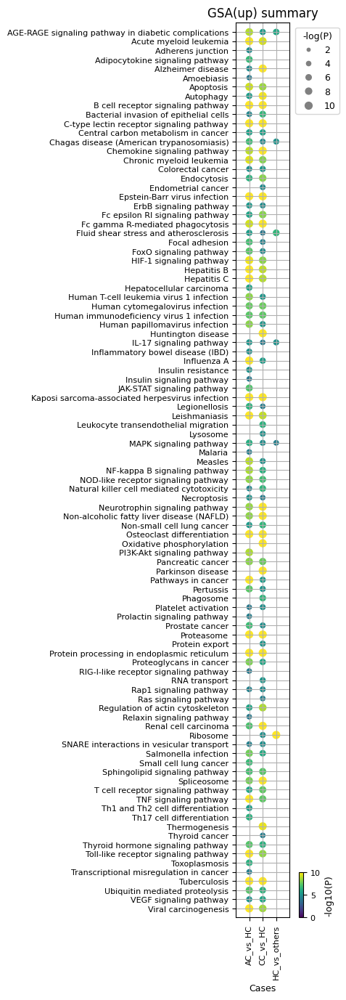

In [67]:
key = 'Macrophage'
gsa_res_t = gsa_res[key]

plot_gsa_dot( gsa_res_t, pval_cutoff = 1e-4, title = 'GSA(up) summary', title_fs = 12,
              tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = (1.2,16),
              dpi = 100, dot_size = 50, cbar_frac = 0.1, cbar_aspect = 10, cmap = 'viridis' )

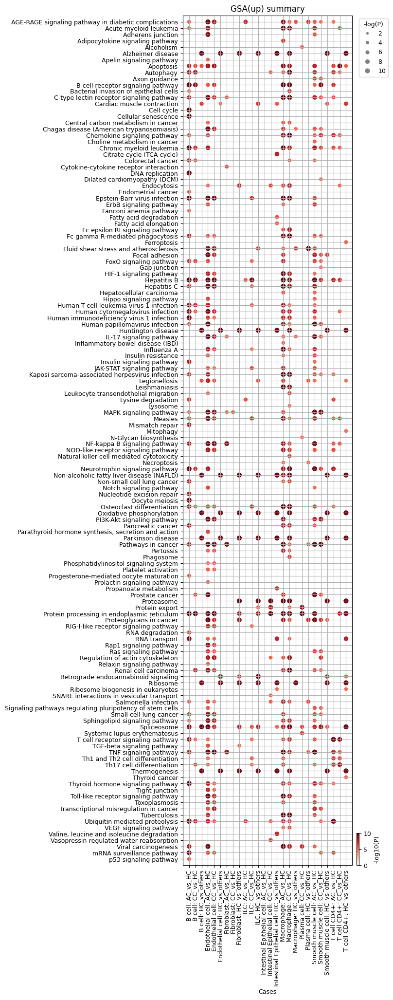

In [60]:
plot_gsa_dot( gsa_res, pval_cutoff = 1e-5, title = 'GSA(up) summary',
              title_fs = 12, tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = None,
              dpi = 100, dot_size = 40, cbar_frac = 0.05, cbar_aspect = 15,
              cmap = 'Reds' )

### __GSEA 분석결과__

In [61]:
gsea_res = adata_t.uns['GSEA_vs_ref']
list(gsea_res.keys())

['B cell',
 'Endothelial cell',
 'Fibroblast',
 'ILC',
 'Intestinal Epithelial cell',
 'Macrophage',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+']

In [62]:
target_cell = 'Macrophage'

gsea_keys = list(gsea_res[target_cell].keys())
list(gsea_keys)

['AC_vs_HC', 'CC_vs_HC', 'HC_vs_others']

##### __특정 세포 유형에 대한 GSEA 결과 확인__

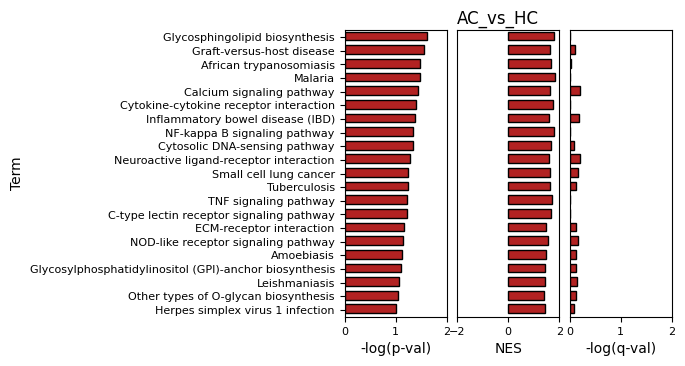

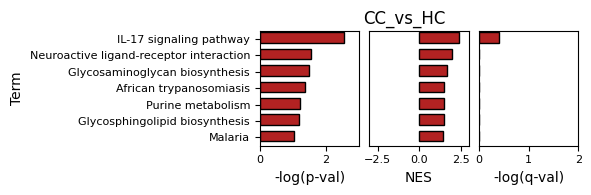

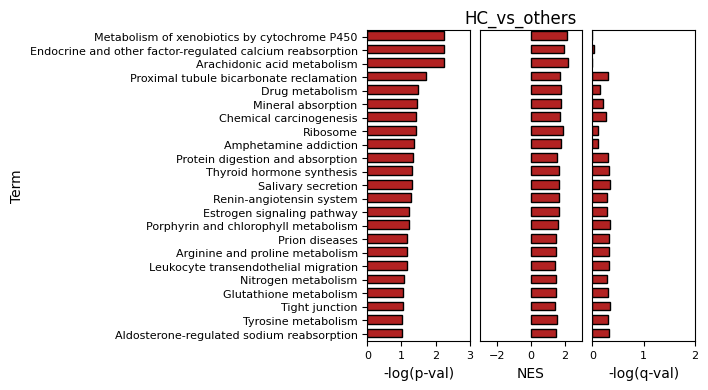

In [63]:
target_cell = 'Macrophage'
# target_cell = 'Aneuploid Epithelial cell'
df_gsea_dct = gsea_res[target_cell]

df_sel_dct = plot_gsa_bar( df_gsea_dct, pval_cutoff = 1e-1,
                  nes_cutoff = 0, N_max_to_show = 50,
                  title = None, bar_width = 0.8,
                  title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                  label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None)

##### __Dot plot으로 GSEA 결과 요약__

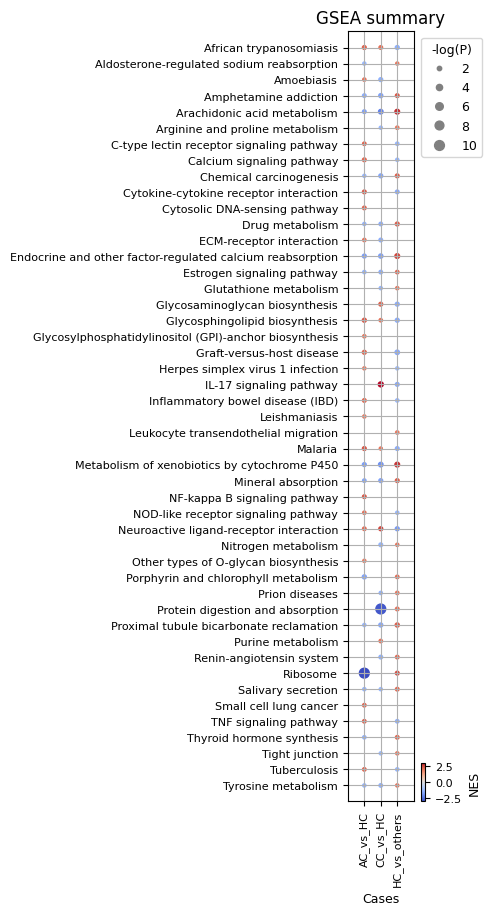

In [64]:
gsea_res_t = gsea_res['Macrophage']
pval_cutoff = 0.1

plot_gsa_dot( gsea_res_t, pval_cutoff = pval_cutoff,
              title = 'GSEA summary', title_fs = 12,
              tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = (1,10),
              dpi = 100, dot_size = 50, cbar_frac = 0.1, cbar_aspect = 10,
              cmap = 'coolwarm' )

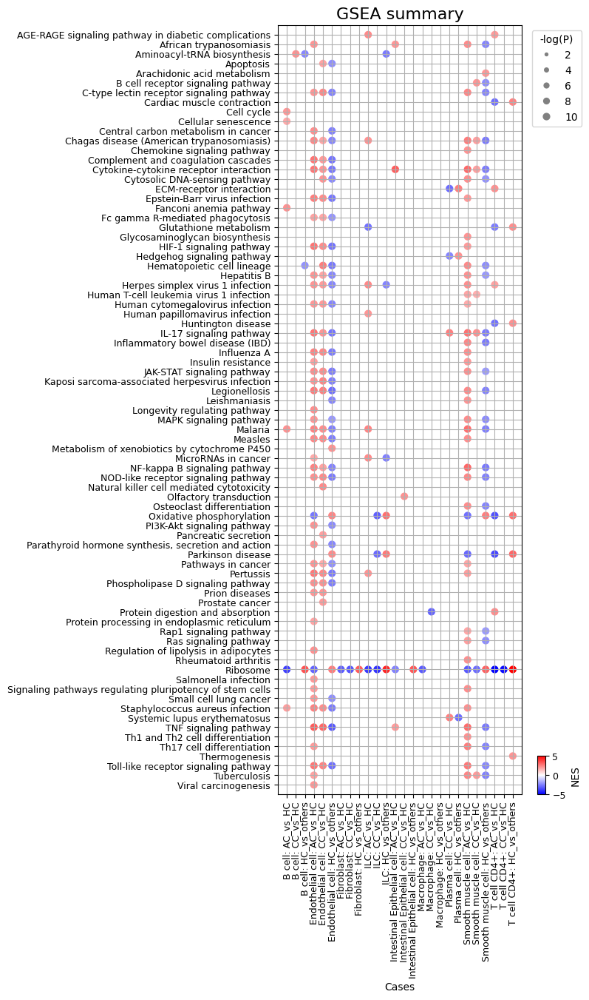

In [65]:
plot_gsa_dot( gsea_res, pval_cutoff = 1e-4,
              title = 'GSEA summary', title_fs = 16,
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 10, legend_fs = 10, swap_ax = False,
              figsize = None, dpi = 100, dot_size = 40,
              cbar_frac = 0.2, cbar_aspect = 5, cmap = 'bwr' )